In [1]:
import os
import random
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image, ImageFile

warnings.filterwarnings("ignore")
ImageFile.LOAD_TRUNCATED_IMAGES = True

SEED = 42

random.seed(SEED)
np.random.seed(SEED)

print("Working directory:", os.getcwd())
print("Random seed:", SEED)

Working directory: /content
Random seed: 42


In [2]:
import tensorflow as tf

print("TensorFlow version:", tf.__version__)
print("GPU devices:", tf.config.list_physical_devices("GPU"))

if tf.config.list_physical_devices("GPU"):
    print("✅ GPU is available.")
else:
    print("⚠️ GPU is not enabled.")

TensorFlow version: 2.20.0
GPU devices: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
✅ GPU is available.


In [3]:
from tensorflow import keras
from tensorflow.keras import layers

print("Keras version:", keras.__version__)
print("✅ TensorFlow/Keras imported successfully.")

Keras version: 3.13.2
✅ TensorFlow/Keras imported successfully.


In [4]:
AUTOTUNE = tf.data.AUTOTUNE

print("AUTOTUNE:", AUTOTUNE)
print("NumPy version:", np.__version__)
print("Pandas version:", pd.__version__)

AUTOTUNE: -1
NumPy version: 2.1.3
Pandas version: 2.2.3


In [5]:
import kagglehub

DATASET_ID = "salader/dogsvscats"

dataset_path = Path(
    kagglehub.dataset_download(DATASET_ID)
)

print("Dataset path:")
print(dataset_path)

Using Colab cache for faster access to the 'dogsvscats' dataset.
Dataset path:
/kaggle/input/dogsvscats


In [6]:
def show_directory_tree(root, max_depth=3):
    root = Path(root)

    print(f"📁 {root}")

    for path in sorted(root.rglob("*")):
        relative = path.relative_to(root)
        depth = len(relative.parts)

        if depth <= max_depth:
            prefix = "    " * max(0, depth - 1)
            icon = "📁" if path.is_dir() else "📄"
            print(f"{prefix}{icon} {path.name}")

show_directory_tree(dataset_path, max_depth=3)

Streaming output truncated to the last 5000 lines.
        📄 dog.4419.jpg
        📄 dog.442.jpg
        📄 dog.4420.jpg
        📄 dog.4421.jpg
        📄 dog.4422.jpg
        📄 dog.4424.jpg
        📄 dog.4425.jpg
        📄 dog.4426.jpg
        📄 dog.4427.jpg
        📄 dog.4431.jpg
        📄 dog.4433.jpg
        📄 dog.4436.jpg
        📄 dog.4438.jpg
        📄 dog.4439.jpg
        📄 dog.444.jpg
        📄 dog.4440.jpg
        📄 dog.4441.jpg
        📄 dog.4442.jpg
        📄 dog.4443.jpg
        📄 dog.4444.jpg
        📄 dog.4445.jpg
        📄 dog.4446.jpg
        📄 dog.445.jpg
        📄 dog.4450.jpg
        📄 dog.4451.jpg
        📄 dog.4452.jpg
        📄 dog.4453.jpg
        📄 dog.4454.jpg
        📄 dog.4455.jpg
        📄 dog.4456.jpg
        📄 dog.4457.jpg
        📄 dog.4458.jpg
        📄 dog.4459.jpg
        📄 dog.446.jpg
        📄 dog.4460.jpg
        📄 dog.4462.jpg
        📄 dog.4463.jpg
        📄 dog.4466.jpg
        📄 dog.4468.jpg
        📄 dog.447.jpg
        📄 dog.4470.jpg
        📄 d

In [7]:
def find_directory(root, directory_name):
    root = Path(root)

    direct = root / directory_name

    if direct.exists() and direct.is_dir():
        return direct

    matches = [
        p for p in root.rglob(directory_name)
        if p.is_dir()
    ]

    if not matches:
        raise FileNotFoundError(
            f"Could not find '{directory_name}' inside {root}"
        )

    return matches[0]

TRAIN_DIR = find_directory(dataset_path, "train")
TEST_DIR = find_directory(dataset_path, "test")

print("TRAIN_DIR:", TRAIN_DIR)
print("TEST_DIR :", TEST_DIR)

TRAIN_DIR: /kaggle/input/dogsvscats/train
TEST_DIR : /kaggle/input/dogsvscats/test


In [8]:
train_class_dirs = sorted(
    [p for p in TRAIN_DIR.iterdir() if p.is_dir()]
)

test_class_dirs = sorted(
    [p for p in TEST_DIR.iterdir() if p.is_dir()]
)

print("Training classes:")
for path in train_class_dirs:
    print(" -", path.name)

print("\nTesting classes:")
for path in test_class_dirs:
    print(" -", path.name)

Training classes:
 - cats
 - dogs

Testing classes:
 - cats
 - dogs


In [9]:
IMAGE_EXTENSIONS = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".webp"
}

In [10]:
def get_image_files(folder):
    folder = Path(folder)

    return sorted([
        path
        for path in folder.rglob("*")
        if path.is_file()
        and path.suffix.lower() in IMAGE_EXTENSIONS
    ])

train_files = get_image_files(TRAIN_DIR)
test_files = get_image_files(TEST_DIR)

print("Training image files:", len(train_files))
print("Testing image files :", len(test_files))

Training image files: 20000
Testing image files : 5000


In [11]:
def count_images(folder):
    folder = Path(folder)
    counts = {}

    for class_dir in sorted(
        [p for p in folder.iterdir() if p.is_dir()]
    ):
        counts[class_dir.name] = sum(
            1
            for path in class_dir.rglob("*")
            if path.is_file()
            and path.suffix.lower() in IMAGE_EXTENSIONS
        )

    return counts

train_counts = count_images(TRAIN_DIR)
test_counts = count_images(TEST_DIR)

stats_df = pd.DataFrame({
    "Train": pd.Series(train_counts),
    "Test": pd.Series(test_counts)
}).fillna(0).astype(int)

stats_df["Total"] = (
    stats_df["Train"] + stats_df["Test"]
)

display(stats_df)

,Train,Test,Total
cats,10000,2500,12500
dogs,10000,2500,12500


In [12]:
print(f"Total training images: {stats_df['Train'].sum():,}")
print(f"Total validation candidates: {stats_df['Train'].sum() * 0.20:,.0f}")
print(f"Total test images: {stats_df['Test'].sum():,}")
print(f"Total images: {stats_df['Total'].sum():,}")

Total training images: 20,000
Total validation candidates: 4,000
Total test images: 5,000
Total images: 25,000


<Figure size 1000x600 with 0 Axes>

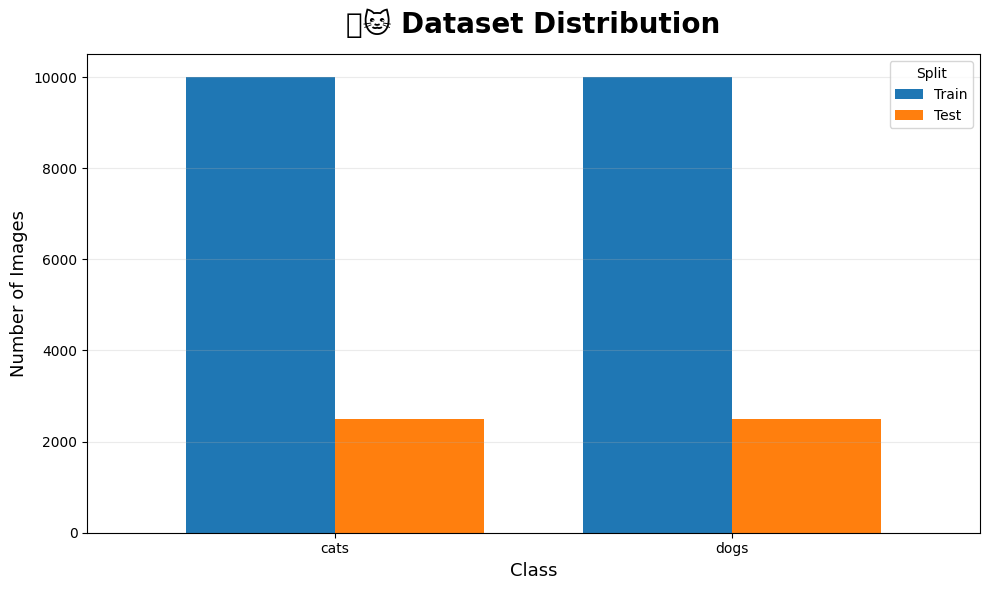

In [13]:
plt.figure(figsize=(10, 6))

ax = stats_df[["Train", "Test"]].plot(
    kind="bar",
    figsize=(10, 6),
    width=0.75
)

ax.set_title(
    "🐶🐱 Dataset Distribution",
    fontsize=20,
    fontweight="bold",
    pad=15
)

ax.set_xlabel("Class", fontsize=13)
ax.set_ylabel("Number of Images", fontsize=13)
ax.grid(axis="y", alpha=0.25)

plt.xticks(rotation=0)
plt.legend(title="Split")
plt.tight_layout()
plt.show()

In [14]:
class_balance = (
    stats_df["Train"] / stats_df["Train"].sum()
).rename("proportion")

display(
    pd.DataFrame(class_balance).style.format(
        {"proportion": "{:.2%}"}
    )
)

,proportion
cats,50.00%
dogs,50.00%


In [15]:
def find_broken_images(folder):
    broken = []

    for path in Path(folder).rglob("*"):
        if (
            path.is_file()
            and path.suffix.lower() in IMAGE_EXTENSIONS
        ):
            try:
                with Image.open(path) as img:
                    img.verify()
            except Exception:
                broken.append(path)

    return broken

broken_train = find_broken_images(TRAIN_DIR)
broken_test = find_broken_images(TEST_DIR)

print("Broken training images:", len(broken_train))
print("Broken test images:", len(broken_test))

Broken training images: 0
Broken test images: 0


In [16]:
all_broken = broken_train + broken_test

if all_broken:
    print("First broken files:")
    for path in all_broken[:20]:
        print(path)
else:
    print("✅ No broken images detected.")

✅ No broken images detected.


In [17]:
def inspect_image_dimensions(paths, max_images=2000):
    records = []

    for path in paths[:max_images]:
        try:
            with Image.open(path) as img:
                width, height = img.size
                mode = img.mode

            records.append({
                "path": str(path),
                "width": width,
                "height": height,
                "mode": mode,
                "aspect_ratio": width / height
            })

        except Exception:
            pass

    return pd.DataFrame(records)

dimension_df = inspect_image_dimensions(
    train_files,
    max_images=min(2000, len(train_files))
)

display(dimension_df.head())

,path,width,height,mode,aspect_ratio
0,/kaggle/input/dogsvscats/train/cats/cat.0.jpg,500,374,RGB,1.336898
1,/kaggle/input/dogsvscats/train/cats/cat.1.jpg,300,280,RGB,1.071429
2,/kaggle/input/dogsvscats/train/cats/cat.100.jpg,403,499,RGB,0.807615
3,/kaggle/input/dogsvscats/train/cats/cat.1000.jpg,150,149,RGB,1.006711
4,/kaggle/input/dogsvscats/train/cats/cat.10002.jpg,499,471,RGB,1.059448


In [18]:
print("Images inspected:", len(dimension_df))

print(
    "Width range:",
    int(dimension_df["width"].min()),
    "to",
    int(dimension_df["width"].max())
)

print(
    "Height range:",
    int(dimension_df["height"].min()),
    "to",
    int(dimension_df["height"].max())
)

print(
    "Mean aspect ratio:",
    round(dimension_df["aspect_ratio"].mean(), 3)
)

Images inspected: 2000
Width range: 50 to 500
Height range: 49 to 500
Mean aspect ratio: 1.198


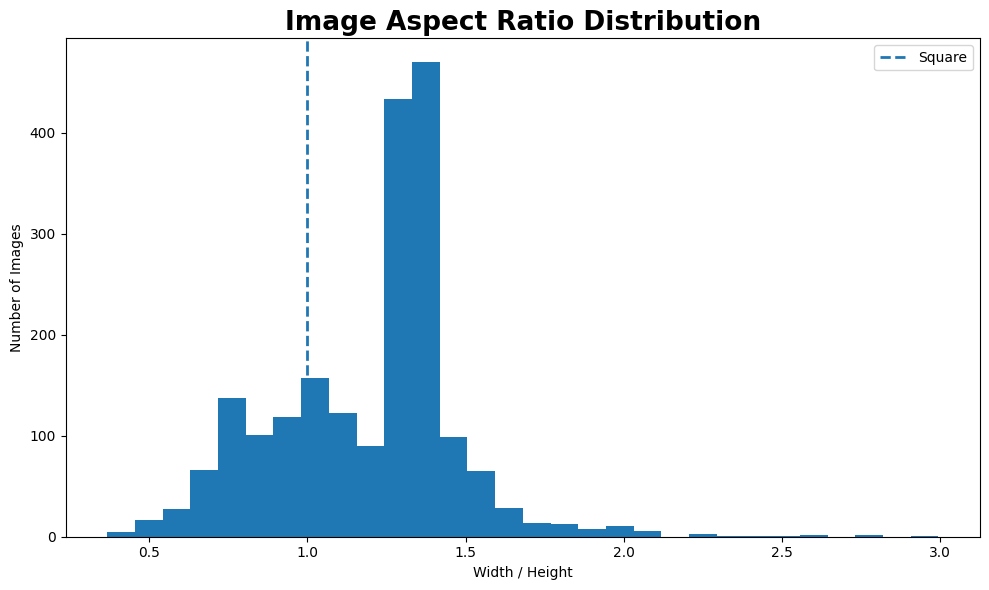

In [19]:
plt.figure(figsize=(10, 6))

plt.hist(
    dimension_df["aspect_ratio"],
    bins=30
)

plt.axvline(
    1.0,
    linestyle="--",
    linewidth=2,
    label="Square"
)

plt.title(
    "Image Aspect Ratio Distribution",
    fontsize=19,
    fontweight="bold"
)

plt.xlabel("Width / Height")
plt.ylabel("Number of Images")
plt.legend()

plt.tight_layout()
plt.show()

In [20]:
def get_random_images(folder, samples_per_class=8):
    folder = Path(folder)
    selected = []

    class_dirs = sorted(
        [p for p in folder.iterdir() if p.is_dir()]
    )

    for class_dir in class_dirs:
        files = get_image_files(class_dir)

        chosen = random.sample(
            files,
            min(samples_per_class, len(files))
        )

        for path in chosen:
            selected.append((path, class_dir.name))

    return selected

samples = get_random_images(
    TRAIN_DIR,
    samples_per_class=8
)

print("Selected images:", len(samples))

Selected images: 16


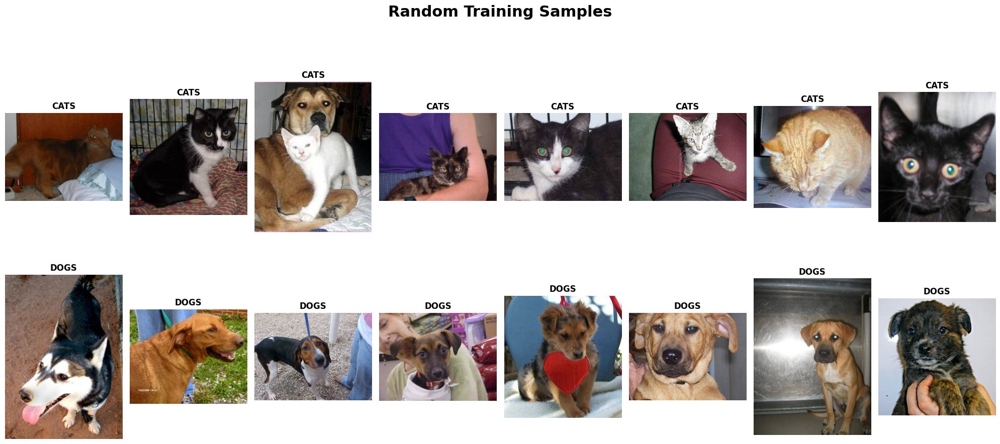

In [21]:
rows = 2
cols = 8

fig, axes = plt.subplots(
    rows,
    cols,
    figsize=(20, 10)
)

fig.suptitle(
    "Random Training Samples",
    fontsize=22,
    fontweight="bold"
)

for ax in axes.flat:
    ax.axis("off")

for ax, (path, label) in zip(
    axes.flat,
    samples
):
    image = Image.open(path).convert("RGB")

    ax.imshow(image)

    ax.set_title(
        label.upper(),
        fontsize=12,
        fontweight="bold"
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

In [22]:
sample_path = samples[0][0]

sample_image = Image.open(
    sample_path
).convert("RGB")

sample_array = np.asarray(
    sample_image
)

print("Sample path:", sample_path)
print("Image shape:", sample_array.shape)
print("Data type:", sample_array.dtype)
print("Minimum pixel value:", sample_array.min())
print("Maximum pixel value:", sample_array.max())

Sample path: /kaggle/input/dogsvscats/train/cats/cat.12031.jpg
Image shape: (283, 376, 3)
Data type: uint8
Minimum pixel value: 0
Maximum pixel value: 255


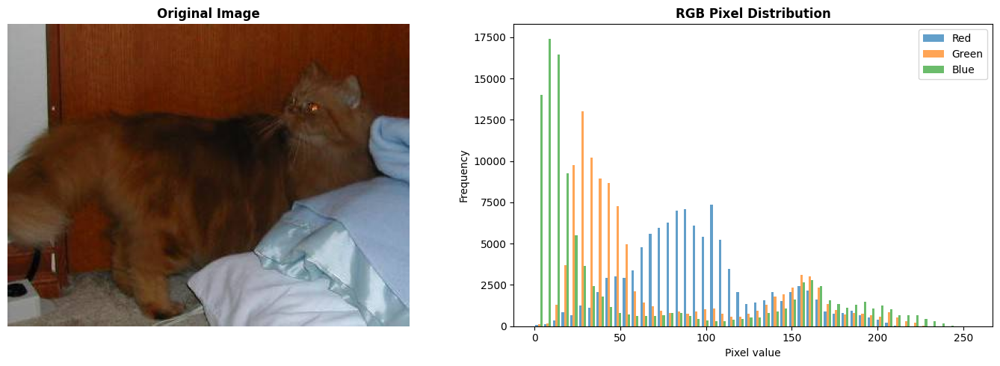

In [23]:
fig = plt.figure(figsize=(14, 5))

ax1 = fig.add_subplot(1, 2, 1)
ax1.imshow(sample_image)
ax1.set_title("Original Image", fontweight="bold")
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
ax2.hist(
    sample_array.reshape(-1, 3),
    bins=50,
    alpha=0.7,
    label=["Red", "Green", "Blue"]
)
ax2.set_title("RGB Pixel Distribution", fontweight="bold")
ax2.set_xlabel("Pixel value")
ax2.set_ylabel("Frequency")
ax2.legend()

plt.tight_layout()
plt.show()

In [24]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

VALIDATION_SPLIT = 0.20

EPOCHS = 50

LEARNING_RATE = 1e-3

print("Image size:", IMG_SIZE)
print("Batch size:", BATCH_SIZE)
print("Validation split:", VALIDATION_SPLIT)
print("Epochs:", EPOCHS)
print("Learning rate:", LEARNING_RATE)

Image size: (224, 224)
Batch size: 32
Validation split: 0.2
Epochs: 50
Learning rate: 0.001


In [25]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    labels="inferred",
    label_mode="binary",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    validation_split=VALIDATION_SPLIT,
    subset="training",
    seed=SEED,
    shuffle=True
)

Found 20000 files belonging to 2 classes.
Using 16000 files for training.


In [26]:
val_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    labels="inferred",
    label_mode="binary",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    validation_split=VALIDATION_SPLIT,
    subset="validation",
    seed=SEED,
    shuffle=False
)

Found 20000 files belonging to 2 classes.
Using 4000 files for validation.


In [27]:
test_ds = tf.keras.utils.image_dataset_from_directory(
    TEST_DIR,
    labels="inferred",
    label_mode="binary",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 5000 files belonging to 2 classes.


In [28]:
CLASS_NAMES = train_ds.class_names

print("Class names:", CLASS_NAMES)
print("Number of classes:", len(CLASS_NAMES))

Class names: ['cats', 'dogs']
Number of classes: 2


In [29]:
print("Training batches:", tf.data.experimental.cardinality(train_ds).numpy())
print("Validation batches:", tf.data.experimental.cardinality(val_ds).numpy())
print("Test batches:", tf.data.experimental.cardinality(test_ds).numpy())

Training batches: 500
Validation batches: 125
Test batches: 157


In [30]:
train_images, train_labels = next(iter(train_ds))

print("Image batch shape:", train_images.shape)
print("Label batch shape:", train_labels.shape)
print("Image dtype:", train_images.dtype)
print("Label dtype:", train_labels.dtype)

Image batch shape: (32, 224, 224, 3)
Label batch shape: (32, 1)
Image dtype: <dtype: 'float32'>
Label dtype: <dtype: 'float32'>


In [31]:
train_ds = train_ds.prefetch(AUTOTUNE)
val_ds = val_ds.prefetch(AUTOTUNE)
test_ds = test_ds.prefetch(AUTOTUNE)

print("✅ Prefetching enabled.")

✅ Prefetching enabled.


In [32]:
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.08),
        layers.RandomZoom(0.12),
        layers.RandomTranslation(0.08, 0.08),
        layers.RandomContrast(0.10)
    ],
    name="data_augmentation"
)

print("✅ Augmentation pipeline created.")

✅ Augmentation pipeline created.


In [33]:
augmentation_input, augmentation_labels = next(
    iter(train_ds)
)

augmentation_output = data_augmentation(
    augmentation_input[:12],
    training=True
)

print(
    "Original batch:",
    augmentation_input[:12].shape
)

print(
    "Augmented batch:",
    augmentation_output.shape
)

Original batch: (12, 224, 224, 3)
Augmented batch: (12, 224, 224, 3)


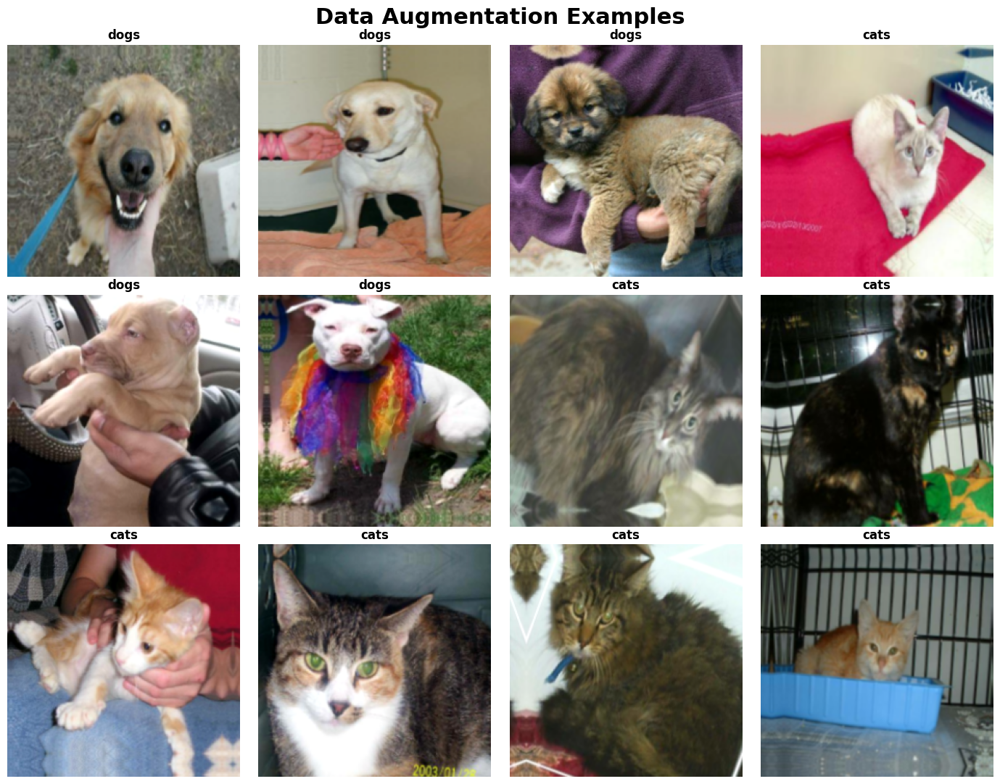

In [34]:
fig, axes = plt.subplots(
    3,
    4,
    figsize=(14, 11)
)

fig.suptitle(
    "Data Augmentation Examples",
    fontsize=22,
    fontweight="bold"
)

for ax, image, label in zip(
    axes.flat,
    augmentation_output,
    augmentation_labels[:12]
):
    image = tf.clip_by_value(
        image,
        0,
        255
    )

    ax.imshow(
        image.numpy().astype("uint8")
    )

    ax.set_title(
        CLASS_NAMES[int(label.numpy()[0])],
        fontsize=12,
        fontweight="bold"
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

In [35]:
model_input = keras.Input(
    shape=(*IMG_SIZE, 3),
    name="image"
)

x = data_augmentation(model_input)

print("Input + augmentation block created.")
print("Current symbolic shape:", x.shape)

Input + augmentation block created.
Current symbolic shape: (None, 224, 224, 3)


In [36]:
x = layers.Rescaling(
    1.0 / 255,
    name="rescaling"
)(x)

print("Rescaling added.")
print("Shape:", x.shape)

Rescaling added.
Shape: (None, 224, 224, 3)


In [37]:
x = layers.Conv2D(
    32,
    3,
    padding="same",
    activation="relu",
    name="conv_1"
)(x)

x = layers.BatchNormalization(
    name="bn_1"
)(x)

x = layers.MaxPooling2D(
    name="pool_1"
)(x)

x = layers.Dropout(
    0.15,
    name="dropout_1"
)(x)

print("Block 1 output shape:", x.shape)

Block 1 output shape: (None, 112, 112, 32)


In [38]:
x = layers.Conv2D(
    64,
    3,
    padding="same",
    activation="relu",
    name="conv_2"
)(x)

x = layers.BatchNormalization(
    name="bn_2"
)(x)

x = layers.MaxPooling2D(
    name="pool_2"
)(x)

x = layers.Dropout(
    0.20,
    name="dropout_2"
)(x)

print("Block 2 output shape:", x.shape)

Block 2 output shape: (None, 56, 56, 64)


In [39]:
x = layers.Conv2D(
    128,
    3,
    padding="same",
    activation="relu",
    name="conv_3"
)(x)

x = layers.BatchNormalization(
    name="bn_3"
)(x)

x = layers.MaxPooling2D(
    name="pool_3"
)(x)

x = layers.Dropout(
    0.25,
    name="dropout_3"
)(x)

print("Block 3 output shape:", x.shape)

Block 3 output shape: (None, 28, 28, 128)


In [40]:
x = layers.Conv2D(
    256,
    3,
    padding="same",
    activation="relu",
    name="conv_4"
)(x)

x = layers.BatchNormalization(
    name="bn_4"
)(x)

x = layers.MaxPooling2D(
    name="pool_4"
)(x)

x = layers.Dropout(
    0.30,
    name="dropout_4"
)(x)

print("Block 4 output shape:", x.shape)

Block 4 output shape: (None, 14, 14, 256)


In [41]:
x = layers.GlobalAveragePooling2D(
    name="global_average_pooling"
)(x)

print("After global average pooling:", x.shape)

After global average pooling: (None, 256)


In [42]:
x = layers.Dense(
    128,
    activation="relu",
    name="dense_128"
)(x)

x = layers.BatchNormalization(
    name="dense_bn"
)(x)

x = layers.Dropout(
    0.40,
    name="dense_dropout"
)(x)

print("Dense block output:", x.shape)

Dense block output: (None, 128)


In [43]:
model_output = layers.Dense(
    1,
    activation="sigmoid",
    name="prediction"
)(x)

print("Final output shape:", model_output.shape)

Final output shape: (None, 1)


In [44]:
model = keras.Model(
    inputs=model_input,
    outputs=model_output,
    name="Dogs_vs_Cats_CNN"
)

print(model.name)

Dogs_vs_Cats_CNN


In [45]:
model.summary()

Model: "Dogs_vs_Cats_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ image (InputLayer)              │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_1 (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_1 (BatchNormalization)       │ (None, 224, 224, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_1 (MaxPooling2D)           │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_2 (Conv2D)                 │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_2 (BatchNormalization)       │ (None, 112, 112, 64)   │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_2 (MaxPooling2D)           │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_3 (Conv2D)                 │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_3 (BatchNormalization)       │ (None, 56, 56, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_3 (MaxPooling2D)           │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_4 (Conv2D)                 │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_4 (BatchNormalization)       │ (None, 28, 28, 256)    │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_4 (MaxPooling2D)           │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling          │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_bn (BatchNormalization)   │ (None, 128)            │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_dropout (Dropout)         │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ prediction (Dense)              │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴─────────────

 Total params: 423,873 (1.62 MB)

 Trainable params: 422,657 (1.61 MB)

 Non-trainable params: 1,216 (4.75 KB)

In [46]:
total_params = model.count_params()

print(
    f"Total trainable parameters: {total_params:,}"
)

Total trainable parameters: 423,873


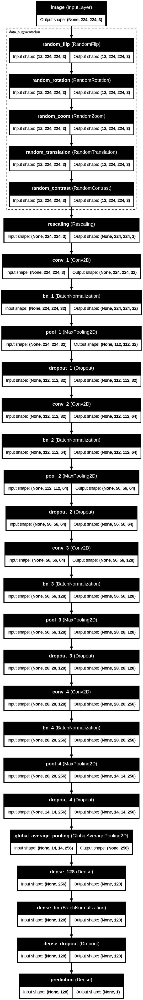

In [47]:
try:
    keras.utils.plot_model(
        model,
        to_file="/content/dogs_vs_cats_model.png",
        show_shapes=True,
        show_layer_names=True,
        expand_nested=True,
        dpi=90
    )

    display(
        Image.open(
            "/content/dogs_vs_cats_model.png"
        )
    )

except Exception as e:
    print("Model diagram error:", e)

In [48]:
model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=LEARNING_RATE
    ),
    loss="binary_crossentropy",
    metrics=[
        keras.metrics.BinaryAccuracy(
            name="accuracy"
        ),
        keras.metrics.Precision(
            name="precision"
        ),
        keras.metrics.Recall(
            name="recall"
        ),
        keras.metrics.AUC(
            name="auc"
        )
    ]
)

print("✅ Model compiled.")

✅ Model compiled.


In [49]:
print("Optimizer:", model.optimizer)
print("Loss:", model.loss)
print("Metrics:", model.metrics_names)

Optimizer: <keras.src.optimizers.adam.Adam object at 0x7fda22e7f4d0>
Loss: binary_crossentropy
Metrics: ['loss', 'compile_metrics']


In [50]:
checkpoint_path = (
    "/content/best_dogs_vs_cats.keras"
)

callbacks = [
    keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=5,
        restore_best_weights=True,
        verbose=1
    ),
    keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.3,
        patience=2,
        min_lr=1e-6,
        verbose=1
    ),
    keras.callbacks.ModelCheckpoint(
        checkpoint_path,
        monitor="val_accuracy",
        save_best_only=True,
        verbose=1
    )
]

print("✅ Callbacks created.")

✅ Callbacks created.


In [51]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.5747 - auc: 0.6086 - loss: 0.7755 - precision: 0.5738 - recall: 0.5678
Epoch 1: val_accuracy improved from None to 0.46775, saving model to /content/best_dogs_vs_cats.keras

Epoch 1: finished saving model to /content/best_dogs_vs_cats.keras
500/500 ━━━━━━━━━━━━━━━━━━━━ 94s 172ms/step - accuracy: 0.5899 - auc: 0.6264 - loss: 0.7297 - precision: 0.5895 - recall: 0.5776 - val_accuracy: 0.4678 - val_auc: 0.0000e+00 - val_loss: 0.7530 - val_precision: 1.0000 - val_recall: 0.4678 - learning_rate: 0.0010
Epoch 2/50
500/500 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.6293 - auc: 0.6803 - loss: 0.6507 - precision: 0.6329 - recall: 0.6021
Epoch 2: val_accuracy improved from 0.46775 to 0.81525, saving model to /content/best_dogs_vs_cats.keras

Epoch 2: finished saving model to /content/best_dogs_vs_cats.keras
500/500 ━━━━━━━━━━━━━━━━━━━━ 87s 173ms/step - accuracy: 0.6423 - auc: 0.6933 - loss: 0.6423 - precision: 0.6470 - rec

In [52]:
history_df = pd.DataFrame(
    history.history
)

display(history_df.round(4))

,accuracy,auc,loss,precision,recall,val_accuracy,val_auc,val_loss,val_precision,val_recall,learning_rate
0,0.5899,0.6264,0.7297,0.5895,0.5776,0.4678,0.0,0.7530,1.0,0.4678,0.0010
1,0.6423,0.6933,0.6423,0.6470,0.6176,0.8152,0.0,0.4636,1.0,0.8152,0.0010
2,0.6731,0.7343,0.6046,0.6821,0.6418,0.1965,0.0,1.3504,1.0,0.1965,0.0010
3,0.7015,0.7734,0.5690,0.7123,0.6704,0.4690,0.0,0.8158,1.0,0.4690,0.0010
4,0.7359,0.8140,0.5251,0.7476,0.7078,0.6170,0.0,0.7147,1.0,0.6170,0.0003
5,0.7517,0.8328,0.5022,0.7634,0.7256,0.8365,0.0,0.3548,1.0,0.8365,0.0003
6,0.7668,0.8489,0.4817,0.7716,0.7543,0.6217,0.0,0.7314,1.0,0.6217,0.0003
7,0.7869,0.8699,0.4505,0.7947,0.7704,0.4360,0.0,1.2113,1.0,0.4360,0.0003
8,0.8104,0.8953,0.4087,0.8126,0.8040,0.7343,0.0,0.5737,1.0,0.7343,0.0001
9,0.8226,0.9054,0.3894,0.8244,0.8172,0.5455,0.0,1.0548,1.0,0.5455,0.0001


In [53]:
best_epoch = (
    history_df["val_accuracy"].idxmax() + 1
)

best_val_accuracy = (
    history_df["val_accuracy"].max()
)

best_val_loss = (
    history_df["val_loss"].min()
)

print("Best validation accuracy:", f"{best_val_accuracy:.4f}")
print("Best validation loss:", f"{best_val_loss:.4f}")
print("Best validation-accuracy epoch:", best_epoch)

Best validation accuracy: 0.8365
Best validation loss: 0.3548
Best validation-accuracy epoch: 6


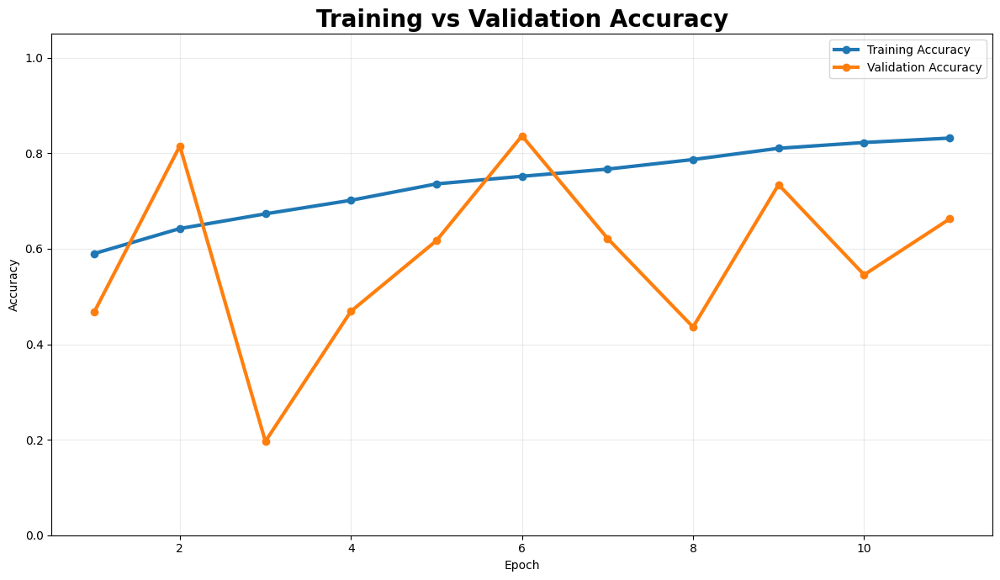

In [54]:
epochs_range = range(
    1,
    len(history_df) + 1
)

plt.figure(figsize=(12, 7))

plt.plot(
    epochs_range,
    history_df["accuracy"],
    marker="o",
    linewidth=3,
    label="Training Accuracy"
)

plt.plot(
    epochs_range,
    history_df["val_accuracy"],
    marker="o",
    linewidth=3,
    label="Validation Accuracy"
)

plt.title(
    "Training vs Validation Accuracy",
    fontsize=20,
    fontweight="bold"
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.ylim(0, 1.05)
plt.grid(alpha=0.25)
plt.legend()

plt.tight_layout()
plt.show()

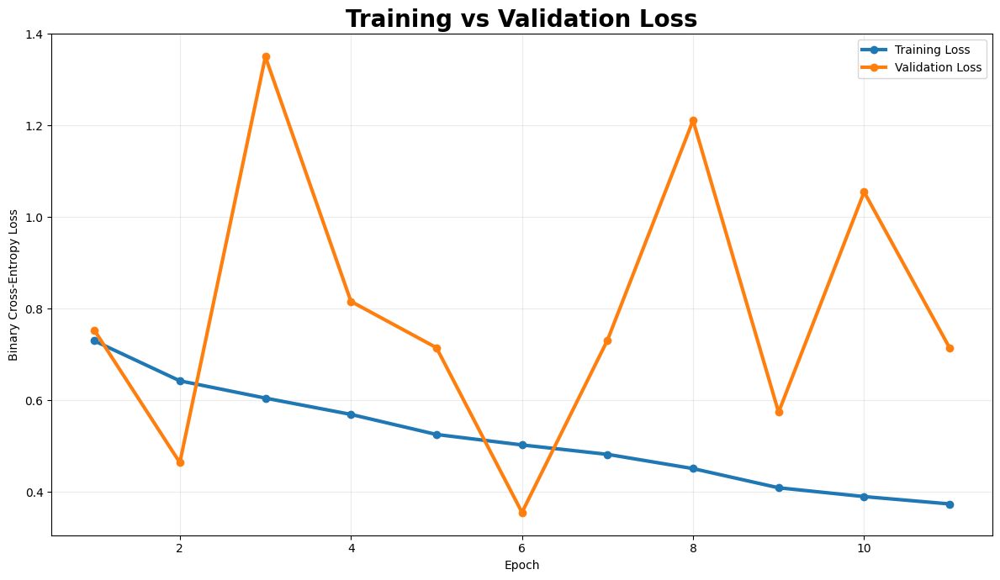

In [55]:
plt.figure(figsize=(12, 7))

plt.plot(
    epochs_range,
    history_df["loss"],
    marker="o",
    linewidth=3,
    label="Training Loss"
)

plt.plot(
    epochs_range,
    history_df["val_loss"],
    marker="o",
    linewidth=3,
    label="Validation Loss"
)

plt.title(
    "Training vs Validation Loss",
    fontsize=20,
    fontweight="bold"
)

plt.xlabel("Epoch")
plt.ylabel("Binary Cross-Entropy Loss")
plt.grid(alpha=0.25)
plt.legend()

plt.tight_layout()
plt.show()

In [56]:
metric_groups = [
    ("precision", "val_precision"),
    ("recall", "val_recall"),
    ("auc", "val_auc")
]

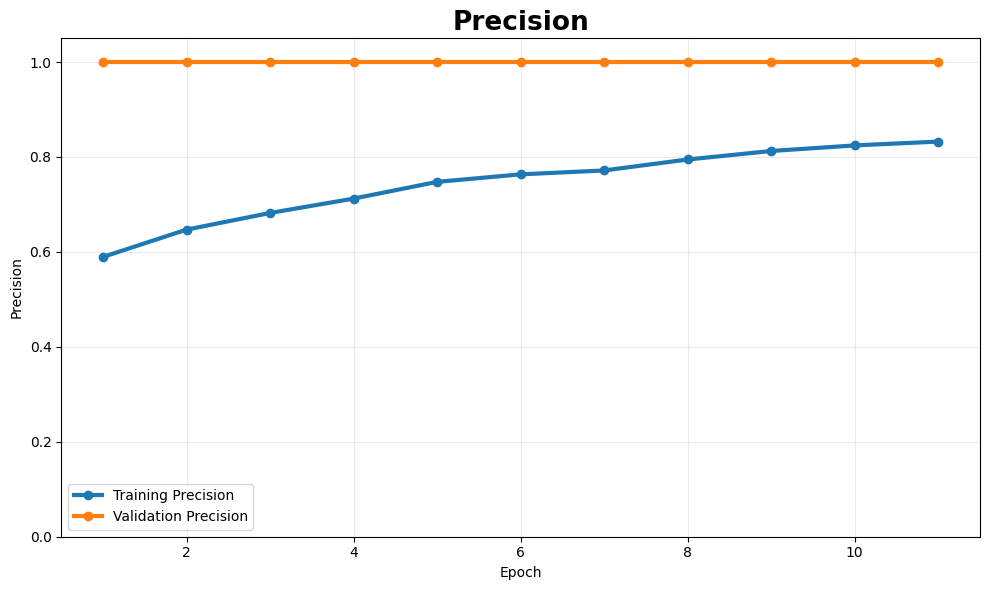

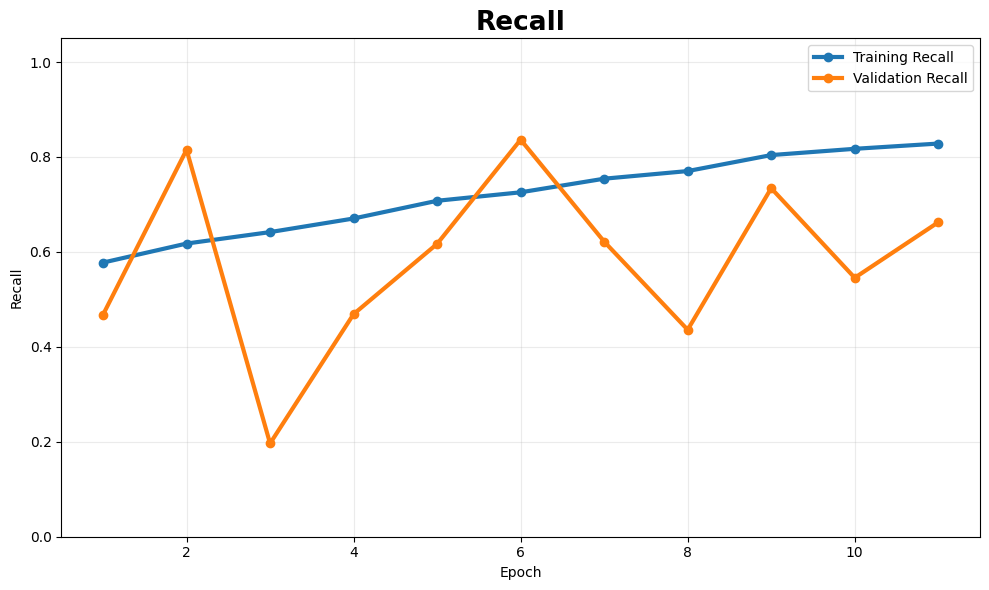

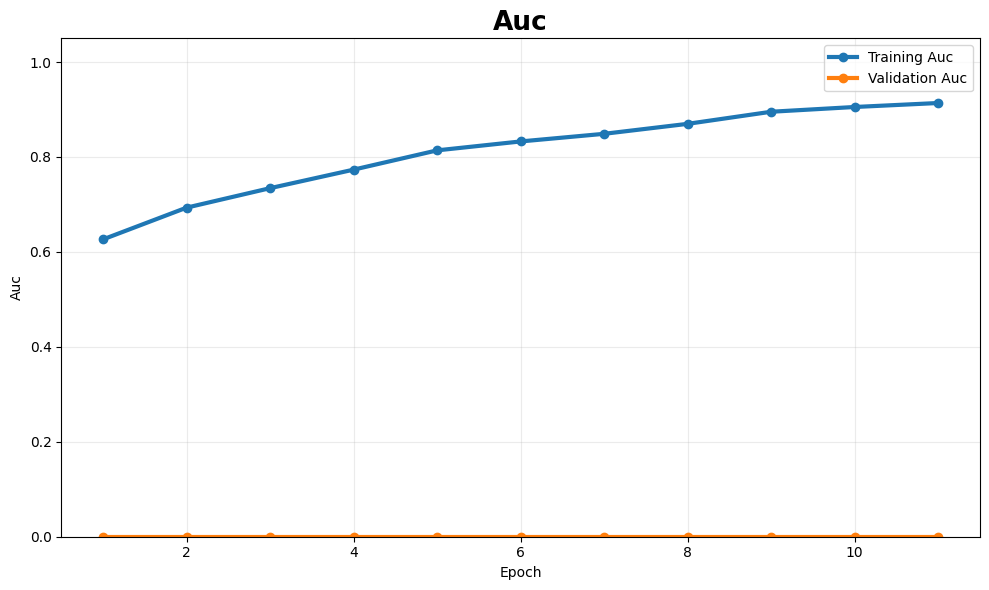

In [57]:
for train_metric, val_metric in metric_groups:
    plt.figure(figsize=(10, 6))

    plt.plot(
        epochs_range,
        history_df[train_metric],
        marker="o",
        linewidth=3,
        label=f"Training {train_metric.title()}"
    )

    plt.plot(
        epochs_range,
        history_df[val_metric],
        marker="o",
        linewidth=3,
        label=f"Validation {train_metric.title()}"
    )

    plt.title(
        train_metric.title(),
        fontsize=19,
        fontweight="bold"
    )

    plt.xlabel("Epoch")
    plt.ylabel(train_metric.title())
    plt.ylim(0, 1.05)
    plt.grid(alpha=0.25)
    plt.legend()

    plt.tight_layout()
    plt.show()

In [58]:
test_results = model.evaluate(
    test_ds,
    verbose=1,
    return_dict=True
)

test_results_df = pd.DataFrame({
    "Metric": list(test_results.keys()),
    "Value": list(test_results.values())
})

test_results_df["Value"] = (
    test_results_df["Value"].round(4)
)

display(test_results_df)

157/157 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step - accuracy: 0.7060 - auc: 0.8052 - loss: 0.5722 - precision: 0.6657 - recall: 0.8276


,Metric,Value
0,accuracy,0.7060
1,auc,0.8052
2,loss,0.5722
3,precision,0.6657
4,recall,0.8276


In [59]:
y_true = []
y_prob = []

In [60]:
for images, labels in test_ds:
    batch_probabilities = (
        model.predict(
            images,
            verbose=0
        )
        .reshape(-1)
    )

    y_prob.extend(
        batch_probabilities
    )

    y_true.extend(
        labels.numpy()
        .reshape(-1)
        .astype(int)
    )

In [61]:
y_true = np.array(y_true)
y_prob = np.array(y_prob)

THRESHOLD = 0.50

y_pred = (
    y_prob >= THRESHOLD
).astype(int)

print("Number of predictions:", len(y_pred))
print("Threshold:", THRESHOLD)
print(
    "Probability range:",
    round(float(y_prob.min()), 4),
    "to",
    round(float(y_prob.max()), 4)
)

Number of predictions: 5000
Threshold: 0.5
Probability range: 0.0004 to 0.9989


In [62]:
print("Actual class counts:")
print(
    pd.Series(y_true)
    .value_counts()
    .sort_index()
    .rename(index=dict(enumerate(CLASS_NAMES)))
)

print("\nPredicted class counts:")
print(
    pd.Series(y_pred)
    .value_counts()
    .sort_index()
    .rename(index=dict(enumerate(CLASS_NAMES)))
)

Actual class counts:
cats    2500
dogs    2500
Name: count, dtype: int64

Predicted class counts:
cats    1892
dogs    3108
Name: count, dtype: int64


In [63]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(
    y_true,
    y_pred
)

print(cm)

[[1461 1039]
 [ 431 2069]]


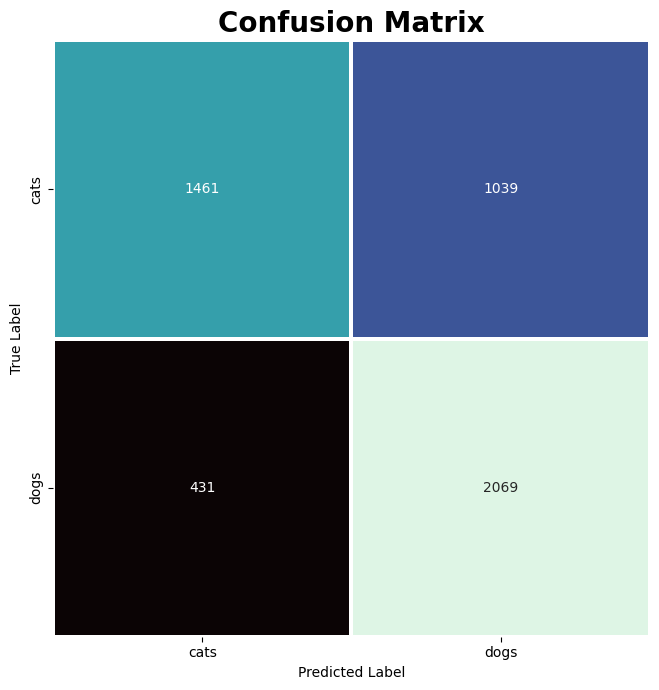

In [64]:
plt.figure(figsize=(8, 7))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="mako",
    square=True,
    linewidths=1.5,
    xticklabels=CLASS_NAMES,
    yticklabels=CLASS_NAMES,
    cbar=False
)

plt.title(
    "Confusion Matrix",
    fontsize=20,
    fontweight="bold"
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")

plt.tight_layout()
plt.show()

In [65]:
tn, fp, fn, tp = cm.ravel()

print("True Negatives :", tn)
print("False Positives:", fp)
print("False Negatives:", fn)
print("True Positives  :", tp)

True Negatives : 1461
False Positives: 1039
False Negatives: 431
True Positives  : 2069


In [66]:
from sklearn.metrics import (
    classification_report
)

report_dict = classification_report(
    y_true,
    y_pred,
    target_names=CLASS_NAMES,
    digits=4,
    output_dict=True
)

report_df = pd.DataFrame(
    report_dict
).T

display(report_df.round(4))

,precision,recall,f1-score,support
cats,0.7722,0.5844,0.6653,2500.000
dogs,0.6657,0.8276,0.7379,2500.000
accuracy,0.7060,0.7060,0.7060,0.706
macro avg,0.7190,0.7060,0.7016,5000.000
weighted avg,0.7190,0.7060,0.7016,5000.000


In [67]:
from sklearn.metrics import (
    roc_curve,
    roc_auc_score
)

fpr, tpr, roc_thresholds = roc_curve(
    y_true,
    y_prob
)

roc_auc = roc_auc_score(
    y_true,
    y_prob
)

print("ROC-AUC:", round(float(roc_auc), 4))

ROC-AUC: 0.8053


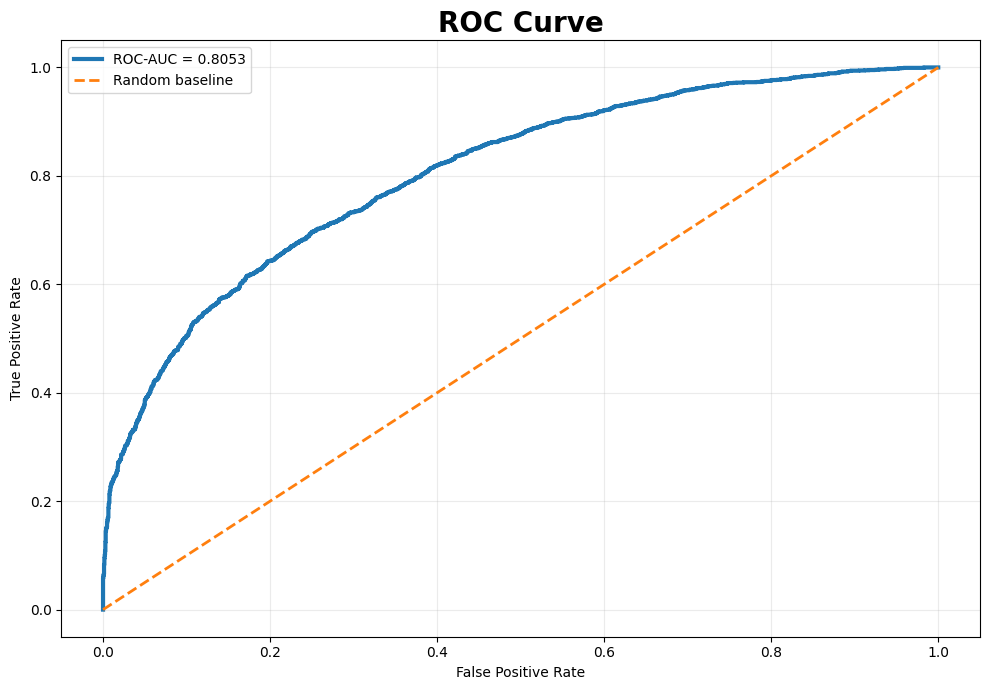

In [68]:
plt.figure(figsize=(10, 7))

plt.plot(
    fpr,
    tpr,
    linewidth=3,
    label=f"ROC-AUC = {roc_auc:.4f}"
)

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=2,
    label="Random baseline"
)

plt.title(
    "ROC Curve",
    fontsize=20,
    fontweight="bold"
)

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.grid(alpha=0.25)
plt.legend()

plt.tight_layout()
plt.show()

In [69]:
from sklearn.metrics import (
    precision_recall_curve,
    average_precision_score
)

precision_values, recall_values, pr_thresholds = (
    precision_recall_curve(
        y_true,
        y_prob
    )
)

average_precision = (
    average_precision_score(
        y_true,
        y_prob
    )
)

print(
    "Average Precision:",
    round(float(average_precision), 4)
)

Average Precision: 0.8169


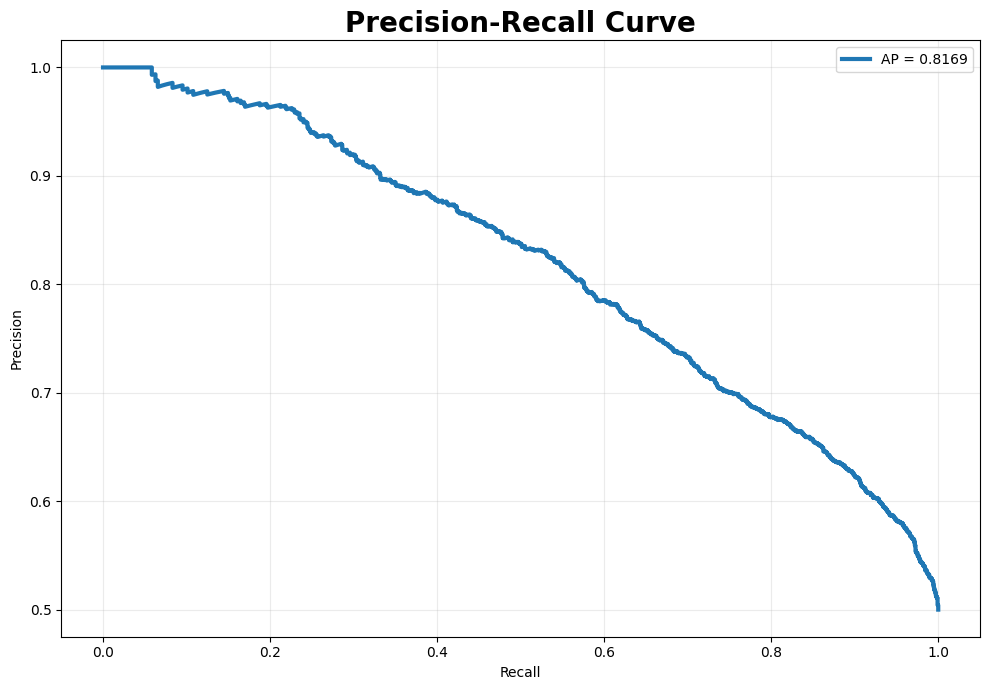

In [70]:
plt.figure(figsize=(10, 7))

plt.plot(
    recall_values,
    precision_values,
    linewidth=3,
    label=f"AP = {average_precision:.4f}"
)

plt.title(
    "Precision-Recall Curve",
    fontsize=20,
    fontweight="bold"
)

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.grid(alpha=0.25)
plt.legend()

plt.tight_layout()
plt.show()

In [71]:
from sklearn.metrics import accuracy_score

threshold_records = []

for threshold in np.arange(
    0.10,
    0.91,
    0.05
):
    threshold_pred = (
        y_prob >= threshold
    ).astype(int)

    threshold_records.append({
        "threshold": threshold,
        "accuracy": accuracy_score(
            y_true,
            threshold_pred
        )
    })

threshold_df = pd.DataFrame(
    threshold_records
)

display(
    threshold_df.round(4)
)

,threshold,accuracy
0,0.10,0.5506
1,0.15,0.5776
2,0.20,0.6044
3,0.25,0.6274
4,0.30,0.6470
5,0.35,0.6638
6,0.40,0.6842
7,0.45,0.6984
8,0.50,0.7060
9,0.55,0.7108


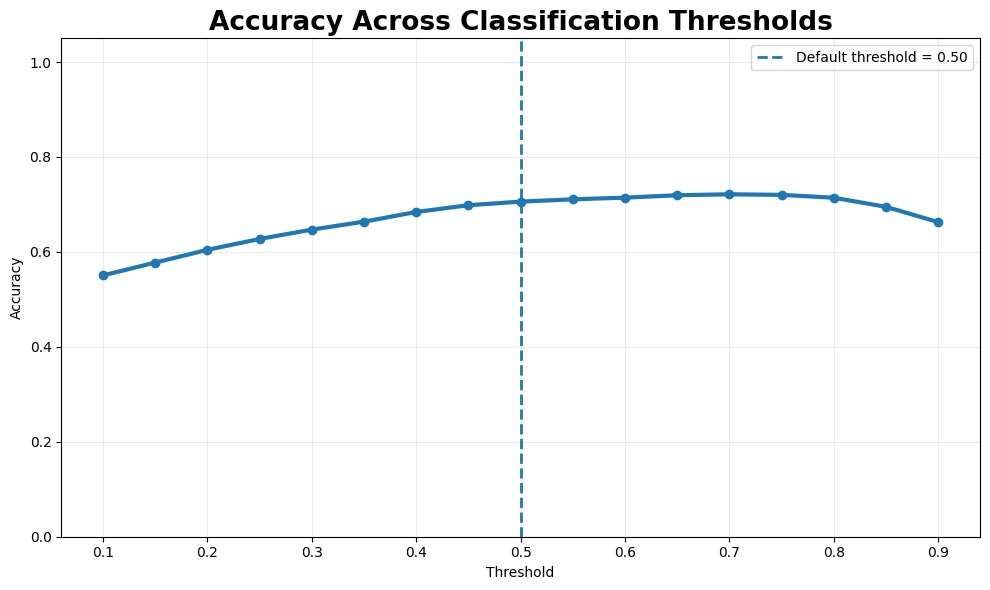

In [72]:
plt.figure(figsize=(10, 6))

plt.plot(
    threshold_df["threshold"],
    threshold_df["accuracy"],
    marker="o",
    linewidth=3
)

plt.axvline(
    0.50,
    linestyle="--",
    linewidth=2,
    label="Default threshold = 0.50"
)

plt.title(
    "Accuracy Across Classification Thresholds",
    fontsize=19,
    fontweight="bold"
)

plt.xlabel("Threshold")
plt.ylabel("Accuracy")
plt.ylim(0, 1.05)
plt.grid(alpha=0.25)
plt.legend()

plt.tight_layout()
plt.show()

In [73]:
confidence = np.maximum(
    y_prob,
    1 - y_prob
)

prediction_confidence_df = pd.DataFrame({
    "true_class": [
        CLASS_NAMES[i]
        for i in y_true
    ],
    "predicted_class": [
        CLASS_NAMES[i]
        for i in y_pred
    ],
    "probability_class_1": y_prob,
    "confidence": confidence,
    "correct": (
        y_true == y_pred
    )
})

display(
    prediction_confidence_df.head(10)
)

,true_class,predicted_class,probability_class_1,confidence,correct
0,cats,cats,0.369477,0.630523,True
1,cats,cats,0.210026,0.789974,True
2,cats,dogs,0.525648,0.525648,False
3,cats,cats,0.132497,0.867503,True
4,cats,dogs,0.586314,0.586314,False
5,cats,dogs,0.782134,0.782134,False
6,cats,cats,0.311744,0.688256,True
7,cats,cats,0.132777,0.867223,True
8,cats,dogs,0.908649,0.908649,False
9,cats,cats,0.491222,0.508778,True


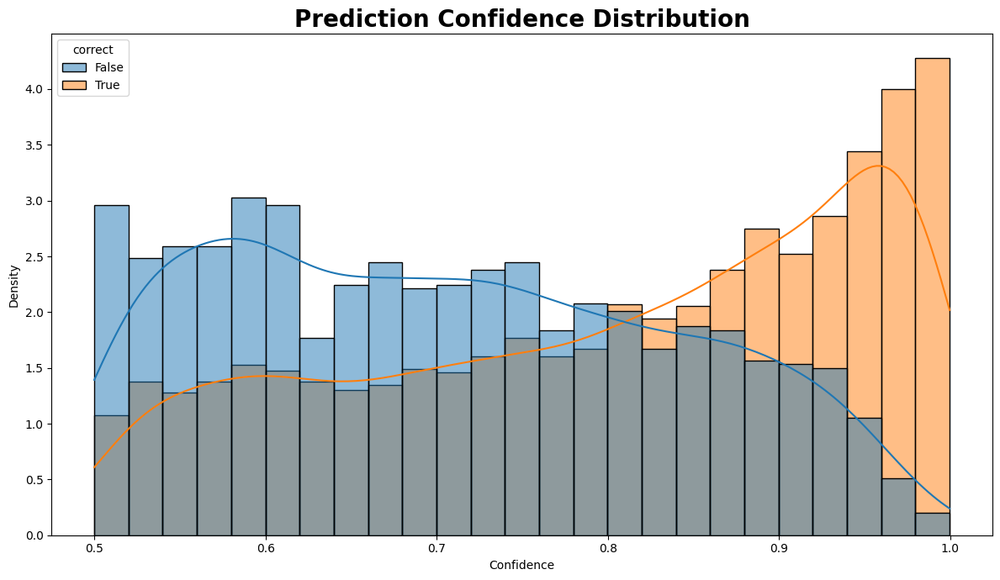

In [74]:
plt.figure(figsize=(12, 7))

sns.histplot(
    data=prediction_confidence_df,
    x="confidence",
    hue="correct",
    bins=25,
    kde=True,
    stat="density",
    common_norm=False
)

plt.title(
    "Prediction Confidence Distribution",
    fontsize=20,
    fontweight="bold"
)

plt.xlabel("Confidence")
plt.ylabel("Density")

plt.tight_layout()
plt.show()

In [75]:
correct_confidence = (
    prediction_confidence_df
    .loc[
        prediction_confidence_df["correct"],
        "confidence"
    ]
)

incorrect_confidence = (
    prediction_confidence_df
    .loc[
        ~prediction_confidence_df["correct"],
        "confidence"
    ]
)

print(
    "Mean confidence — correct:",
    round(float(correct_confidence.mean()), 4)
)

if len(incorrect_confidence) > 0:
    print(
        "Mean confidence — incorrect:",
        round(float(incorrect_confidence.mean()), 4)
    )
else:
    print(
        "Mean confidence — incorrect: no errors"
    )

Mean confidence — correct: 0.8031
Mean confidence — incorrect: 0.7066


In [76]:
test_file_paths = get_image_files(
    TEST_DIR
)

print(
    "Test file paths:",
    len(test_file_paths)
)

print(
    "Predictions:",
    len(y_pred)
)

Test file paths: 5000
Predictions: 5000


In [77]:
if len(test_file_paths) != len(y_pred):
    raise ValueError(
        "The number of test paths and predictions do not match."
    )

prediction_records = []

for path, true_label, probability, predicted_label in zip(
    test_file_paths,
    y_true,
    y_prob,
    y_pred
):
    prediction_records.append({
        "path": str(path),
        "true_label": CLASS_NAMES[int(true_label)],
        "predicted_label": CLASS_NAMES[int(predicted_label)],
        "probability_class_1": float(probability),
        "confidence": float(
            max(probability, 1 - probability)
        ),
        "correct": bool(
            true_label == predicted_label
        )
    })

predictions_df = pd.DataFrame(
    prediction_records
)

display(
    predictions_df.head(10)
)

,path,true_label,predicted_label,probability_class_1,confidence,correct
0,/kaggle/input/dogsvscats/test/cats/cat.10.jpg,cats,cats,0.369477,0.630523,True
1,/kaggle/input/dogsvscats/test/cats/cat.10000.jpg,cats,cats,0.210026,0.789974,True
2,/kaggle/input/dogsvscats/test/cats/cat.10001.jpg,cats,dogs,0.525648,0.525648,False
3,/kaggle/input/dogsvscats/test/cats/cat.10007.jpg,cats,cats,0.132497,0.867503,True
4,/kaggle/input/dogsvscats/test/cats/cat.10017.jpg,cats,dogs,0.586314,0.586314,False
5,/kaggle/input/dogsvscats/test/cats/cat.10021.jpg,cats,dogs,0.782134,0.782134,False
6,/kaggle/input/dogsvscats/test/cats/cat.10026.jpg,cats,cats,0.311744,0.688256,True
7,/kaggle/input/dogsvscats/test/cats/cat.10030.jpg,cats,cats,0.132777,0.867223,True
8,/kaggle/input/dogsvscats/test/cats/cat.10033.jpg,cats,dogs,0.908649,0.908649,False
9,/kaggle/input/dogsvscats/test/cats/cat.10035.jpg,cats,cats,0.491222,0.508778,True


In [78]:
misclassified_df = (
    predictions_df[
        ~predictions_df["correct"]
    ]
    .sort_values(
        "confidence",
        ascending=False
    )
)

print(
    "Total misclassified:",
    len(misclassified_df)
)

display(
    misclassified_df.head(20)
)

Total misclassified: 1470


,path,true_label,predicted_label,probability_class_1,confidence,correct
2288,/kaggle/input/dogsvscats/test/cats/cat.9009.jpg,cats,dogs,0.987184,0.987184,False
308,/kaggle/input/dogsvscats/test/cats/cat.11355.jpg,cats,dogs,0.986371,0.986371,False
2371,/kaggle/input/dogsvscats/test/cats/cat.9390.jpg,cats,dogs,0.985965,0.985965,False
1842,/kaggle/input/dogsvscats/test/cats/cat.6992.jpg,cats,dogs,0.983143,0.983143,False
1958,/kaggle/input/dogsvscats/test/cats/cat.7531.jpg,cats,dogs,0.981611,0.981611,False
1592,/kaggle/input/dogsvscats/test/cats/cat.5931.jpg,cats,dogs,0.980325,0.980325,False
1871,/kaggle/input/dogsvscats/test/cats/cat.7119.jpg,cats,dogs,0.979125,0.979125,False
3652,/kaggle/input/dogsvscats/test/dogs/dog.381.jpg,dogs,cats,0.022779,0.977221,False
710,/kaggle/input/dogsvscats/test/cats/cat.1953.jpg,cats,dogs,0.975666,0.975666,False
3148,/kaggle/input/dogsvscats/test/dogs/dog.1596.jpg,dogs,cats,0.024742,0.975258,False


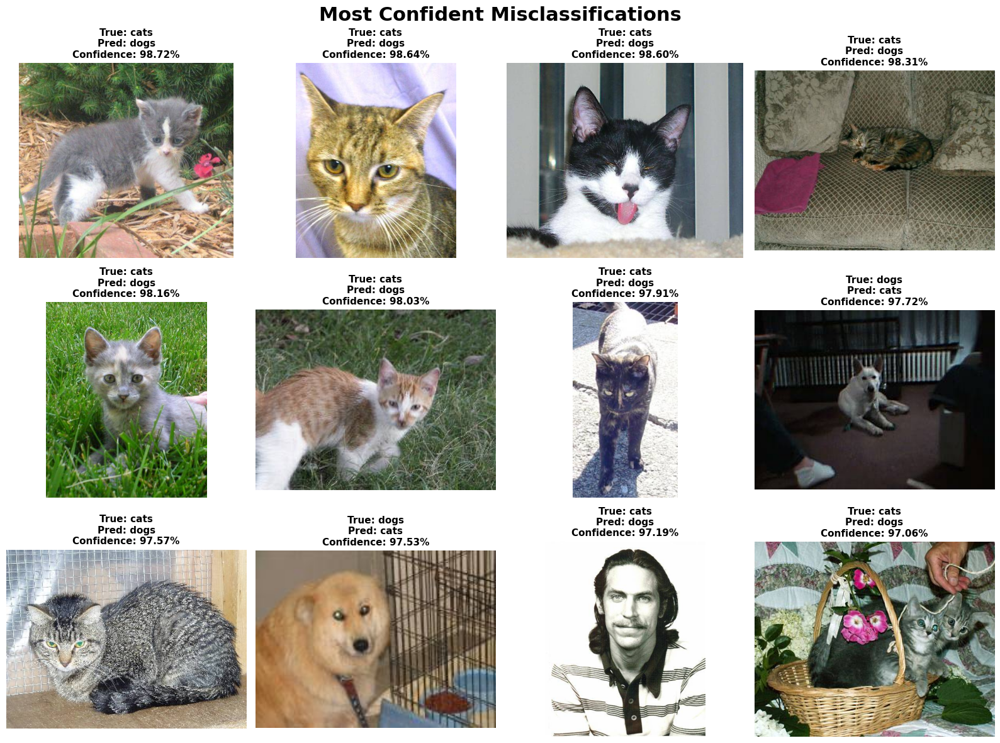

In [79]:
n_show = min(
    12,
    len(misclassified_df)
)

if n_show == 0:
    print(
        "🎉 No misclassified images found."
    )
else:
    fig, axes = plt.subplots(
        3,
        4,
        figsize=(16, 12)
    )

    fig.suptitle(
        "Most Confident Misclassifications",
        fontsize=22,
        fontweight="bold"
    )

    for ax in axes.flat:
        ax.axis("off")

    for ax, (_, row) in zip(
        axes.flat,
        misclassified_df.head(n_show).iterrows()
    ):
        image = (
            Image.open(row["path"])
            .convert("RGB")
        )

        ax.imshow(image)

        ax.set_title(
            f"True: {row['true_label']}\n"
            f"Pred: {row['predicted_label']}\n"
            f"Confidence: {row['confidence']:.2%}",
            fontsize=11,
            fontweight="bold"
        )

        ax.axis("off")

    plt.tight_layout()
    plt.show()

In [80]:
n_random = min(
    12,
    len(test_file_paths)
)

chosen_indices = np.random.choice(
    len(test_file_paths),
    size=n_random,
    replace=False
)

print(
    "Random samples:",
    n_random
)

Random samples: 12


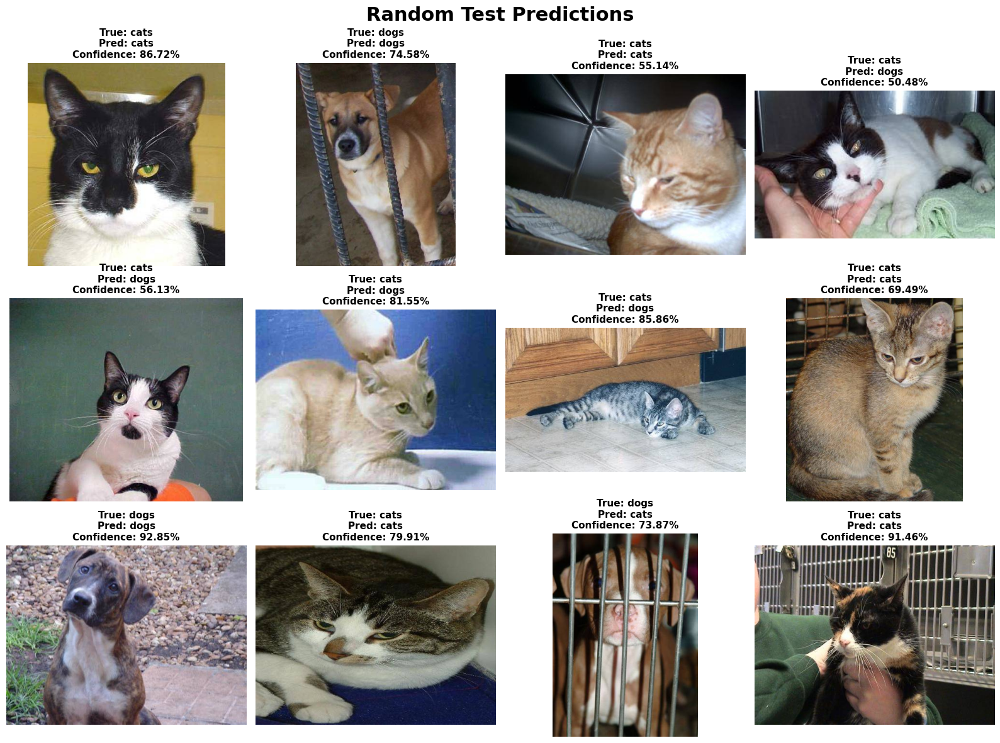

In [81]:
fig, axes = plt.subplots(
    3,
    4,
    figsize=(16, 12)
)

fig.suptitle(
    "Random Test Predictions",
    fontsize=22,
    fontweight="bold"
)

for ax in axes.flat:
    ax.axis("off")

for ax, idx in zip(
    axes.flat,
    chosen_indices
):
    image = (
        Image.open(
            test_file_paths[idx]
        )
        .convert("RGB")
    )

    probability = y_prob[idx]

    predicted_idx = int(
        probability >= THRESHOLD
    )

    predicted_name = (
        CLASS_NAMES[predicted_idx]
    )

    true_name = (
        CLASS_NAMES[y_true[idx]]
    )

    confidence_value = max(
        probability,
        1 - probability
    )

    ax.imshow(image)

    ax.set_title(
        f"True: {true_name}\n"
        f"Pred: {predicted_name}\n"
        f"Confidence: {confidence_value:.2%}",
        fontsize=11,
        fontweight="bold"
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

In [82]:
conv_layer_names = [
    layer.name
    for layer in model.layers
    if isinstance(
        layer,
        keras.layers.Conv2D
    )
]

print(
    "Convolutional layers:",
    conv_layer_names
)

Convolutional layers: ['conv_1', 'conv_2', 'conv_3', 'conv_4']


In [83]:
feature_model = keras.Model(
    inputs=model.input,
    outputs=[
        model.get_layer(
            name
        ).output
        for name in conv_layer_names
    ]
)

print(
    "Feature model created."
)

Feature model created.


In [84]:
feature_input = train_images[:1]

feature_outputs = feature_model.predict(
    feature_input,
    verbose=0
)

for layer_name, output in zip(
    conv_layer_names,
    feature_outputs
):
    print(
        f"{layer_name:10s}",
        output.shape
    )

conv_1     (1, 224, 224, 32)
conv_2     (1, 112, 112, 64)
conv_3     (1, 56, 56, 128)
conv_4     (1, 28, 28, 256)


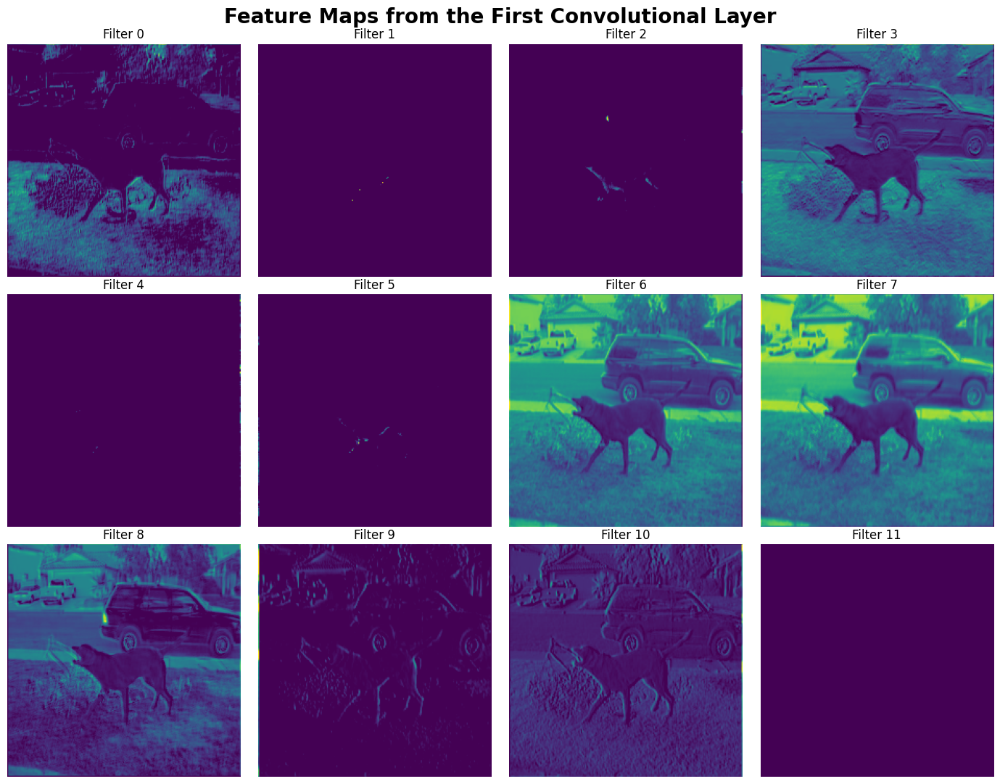

In [85]:
first_feature_maps = feature_outputs[0][0]

n_feature_maps = min(
    12,
    first_feature_maps.shape[-1]
)

fig, axes = plt.subplots(
    3,
    4,
    figsize=(14, 11)
)

fig.suptitle(
    "Feature Maps from the First Convolutional Layer",
    fontsize=20,
    fontweight="bold"
)

for ax, channel in zip(
    axes.flat,
    range(n_feature_maps)
):
    ax.imshow(
        first_feature_maps[:, :, channel],
        cmap="viridis"
    )

    ax.set_title(
        f"Filter {channel}"
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

In [86]:
from google.colab import files

uploaded = files.upload()

if uploaded:
    custom_image_path = next(
        iter(uploaded)
    )

    print(
        "Uploaded:",
        custom_image_path
    )
else:
    custom_image_path = None

Saving cat.jpg to cat.jpg
Uploaded: cat.jpg


Original size: (194, 260)


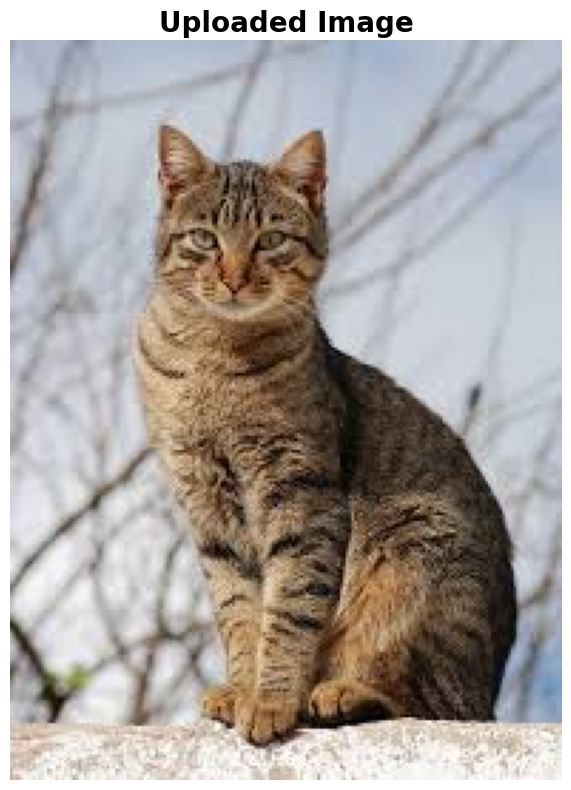

In [87]:
if custom_image_path is not None:
    custom_original = (
        Image.open(
            custom_image_path
        )
        .convert("RGB")
    )

    print(
        "Original size:",
        custom_original.size
    )

    plt.figure(figsize=(8, 8))

    plt.imshow(custom_original)

    plt.title(
        "Uploaded Image",
        fontsize=20,
        fontweight="bold"
    )

    plt.axis("off")

    plt.tight_layout()
    plt.show()
else:
    print(
        "No image uploaded."
    )

In [88]:
def preprocess_custom_image(
    image_path,
    target_size
):
    image = (
        Image.open(image_path)
        .convert("RGB")
    )

    resized = image.resize(
        target_size
    )

    array = np.asarray(
        resized
    ).astype("float32")

    tensor = tf.expand_dims(
        array,
        axis=0
    )

    return image, resized, tensor

In [89]:
if custom_image_path is not None:
    original, resized, custom_tensor = (
        preprocess_custom_image(
            custom_image_path,
            IMG_SIZE
        )
    )

    raw_probability = float(
        model.predict(
            custom_tensor,
            verbose=0
        )[0][0]
    )

    predicted_index = int(
        raw_probability >= THRESHOLD
    )

    predicted_class = (
        CLASS_NAMES[predicted_index]
    )

    custom_confidence = max(
        raw_probability,
        1 - raw_probability
    )

    print(
        "Prediction:",
        predicted_class.upper()
    )

    print(
        "Confidence:",
        f"{custom_confidence:.2%}"
    )

    print(
        "Raw probability for class 1:",
        f"{raw_probability:.4f}"
    )
else:
    print(
        "Upload an image first."
    )

Prediction: DOGS
Confidence: 53.48%
Raw probability for class 1: 0.5348


In [90]:
def make_gradcam_heatmap(
    image_tensor,
    trained_model,
    last_conv_layer_name
):
    grad_model = keras.models.Model(
        trained_model.inputs,
        [
            trained_model.get_layer(
                last_conv_layer_name
            ).output,
            trained_model.output
        ]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = (
            grad_model(image_tensor)
        )

        class_score = predictions[:, 0]

    gradients = tape.gradient(
        class_score,
        conv_outputs
    )

    pooled_gradients = tf.reduce_mean(
        gradients,
        axis=(0, 1, 2)
    )

    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_sum(
        conv_outputs
        * pooled_gradients[tf.newaxis, tf.newaxis, :],
        axis=-1
    )

    heatmap = tf.maximum(
        heatmap,
        0
    )

    heatmap = (
        heatmap
        / (
            tf.reduce_max(
                heatmap
            )
            + tf.keras.backend.epsilon()
        )
    )

    return heatmap.numpy()

In [91]:
LAST_CONV_LAYER = conv_layer_names[-1]

print(
    "Last convolutional layer:",
    LAST_CONV_LAYER
)

Last convolutional layer: conv_4


In [92]:
if custom_image_path is not None:
    original, resized, custom_tensor = (
        preprocess_custom_image(
            custom_image_path,
            IMG_SIZE
        )
    )

    heatmap = make_gradcam_heatmap(
        custom_tensor,
        model,
        LAST_CONV_LAYER
    )

    print(
        "Heatmap shape:",
        heatmap.shape
    )

    print(
        "Heatmap range:",
        round(float(heatmap.min()), 4),
        "to",
        round(float(heatmap.max()), 4)
    )
else:
    print(
        "Upload an image before generating Grad-CAM."
    )

Heatmap shape: (28, 28)
Heatmap range: 0.0 to 1.0


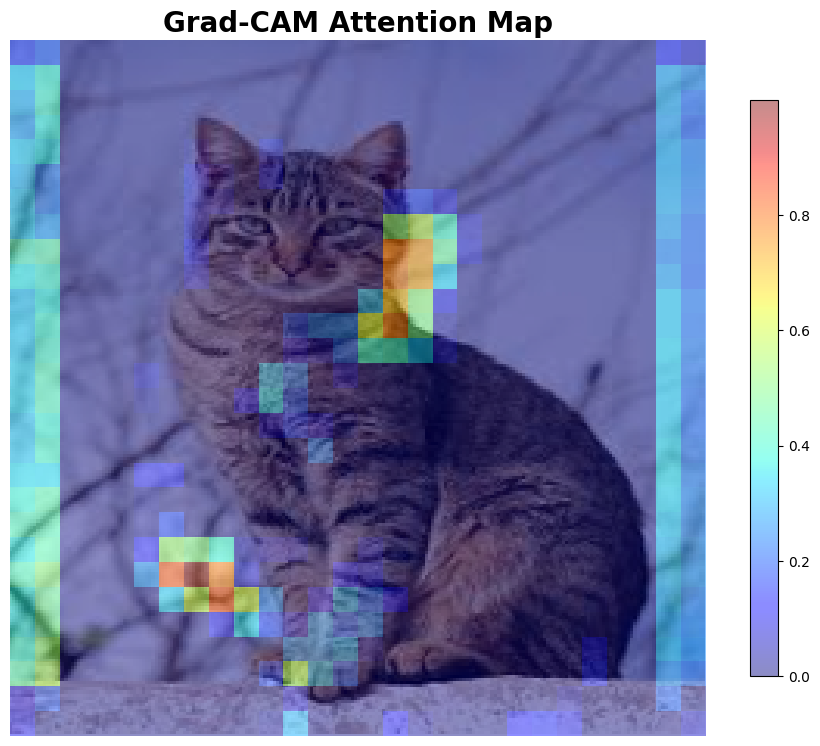

In [93]:
if custom_image_path is not None:
    plt.figure(figsize=(9, 8))

    plt.imshow(resized)

    plt.imshow(
        heatmap,
        cmap="jet",
        alpha=0.45,
        extent=(
            0,
            IMG_SIZE[1],
            IMG_SIZE[0],
            0
        )
    )

    plt.title(
        "Grad-CAM Attention Map",
        fontsize=20,
        fontweight="bold"
    )

    plt.axis("off")
    plt.colorbar(
        shrink=0.75
    )

    plt.tight_layout()
    plt.show()
else:
    print(
        "No Grad-CAM image available."
    )

In [94]:
final_model_path = (
    "/content/dogs_vs_cats_cnn_final.keras"
)

model.save(
    final_model_path
)

print(
    "Saved model:",
    final_model_path
)

Saved model: /content/dogs_vs_cats_cnn_final.keras


In [95]:
reloaded_model = keras.models.load_model(
    final_model_path
)

print(
    "Reloaded model:",
    reloaded_model.name
)

print(
    "Reloaded parameters:",
    f"{reloaded_model.count_params():,}"
)

Reloaded model: Dogs_vs_Cats_CNN
Reloaded parameters: 423,873


In [96]:
reload_test = reloaded_model.evaluate(
    test_ds,
    verbose=0,
    return_dict=True
)

print("Reloaded model test metrics:")

for metric_name, metric_value in reload_test.items():
    print(
        f"{metric_name:>10}: {metric_value:.4f}"
    )

Reloaded model test metrics:
  accuracy: 0.7072
       auc: 0.8059
      loss: 0.5705
 precision: 0.6673
    recall: 0.8264


In [97]:
from google.colab import files

files.download(
    final_model_path
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>